In [27]:
import pandas as pd

df = pd.read_csv("df_times_cleaned.csv")

# df["SUB_TYPE"].unique()
df.columns
# Features to include:
# Latitude
# Longitude
# Subtype
# Zip Code
# Council_District
# Rest_51_Percent_Food_Sales



Index(['SUB_TYPE', 'EVENT_MONTH', 'AMPLIFIED_SOUND_DISTRICT', 'EVENT_YEAR',
       'CAPACITY', 'DECIBEL_LEVEL', 'END_HOURS_CONC_POUR_MON_SAT',
       'END_HOURS_NEAR_HOME_FRI_SAT', 'END_HOURS_NEAR_HOME_SUN_THUR',
       'END_HOURS_NOT_NEAR_HOME', 'EXISTING_ZONING', 'EXPIRATION_DATE',
       'IN_DATE', 'ISSUE_DATE', 'ISSUED_BY', 'OMV_FRI_END_TIME',
       'OMV_FRI_START_TIME', 'OMV_MON_END_TIME', 'OMV_MON_START_TIME',
       'OMV_SAT_END_TIME', 'OMV_SAT_START_TIME', 'OMV_SUN_END_TIME',
       'OMV_SUN_START_TIME', 'OMV_THU_END_TIME', 'OMV_THU_START_TIME',
       'OMV_TUE_END_TIME', 'OMV_TUE_START_TIME', 'OMV_WED_END_TIME',
       'OMV_WED_START_TIME', 'REST_51_PERCENT_FOOD_SALES', 'SQUARE_FOOTAGE',
       'START_DATE', 'MULTIPLE_START_DATES', 'START_HOURS_CONC_POUR_MON_SAT',
       'START_HOURS_NEAR_HOME_FRI_SAT', 'START_HOURS_NEAR_HOME_SUN_THUR',
       'START_HOURS_NOT_NEAR_HOME', 'STATUS', 'STREET_ADDRESS', 'ZIPCODE',
       'LATITUDE', 'LONGITUDE', 'COUNCIL_DISTRICT', 'time_diff', '

In [49]:
import folium
from folium import Element

# Create a single map centered around Austin
austin_map = folium.Map(location=[30.2672, -97.7431], zoom_start=12)

# Color mapping for each subtype
color_dict = {
    'Outdoor Music Venue': 'blue',
    'Concrete Pouring': 'green',
    'Private Sound Amplification': 'red',
    'Government Amplified Sound': 'orange',
    'Advertising Sound Amplification': 'purple',
    'Public Sound Amplification': 'yellow'
}

# Add all points to the map
for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row['LATITUDE'], row['LONGITUDE']),
        radius=3,
        color=color_dict.get(row['SUB_TYPE'], 'gray'),
        fill=True,
        fill_color=color_dict.get(row['SUB_TYPE'], 'gray'),
        fill_opacity=0.6,
        popup=row['SUB_TYPE']
    ).add_to(austin_map)

# Create legend HTML
legend_html = """
<div style="
    position: fixed; 
    bottom: 50px; left: 50px; width: 220px; z-index:9999; font-size:14px;
    background-color: white; padding: 10px; border:2px solid gray; border-radius:8px;
">
<b>Legend</b><br>
<span style="color: blue;">●</span> Outdoor Music Venue<br>
<span style="color: green;">●</span> Concrete Pouring<br>
<span style="color: red;">●</span> Private Sound Amplification<br>
<span style="color: orange;">●</span> Government Amplified Sound<br>
<span style="color: purple;">●</span> Advertising Sound Amplification<br>
<span style="color: yellow;">●</span> Public Sound Amplification
</div>
"""

# Add legend to map
austin_map.get_root().html.add_child(Element(legend_html))

# Display the map
display(austin_map)


In [29]:
import pandas as pd
import numpy as np

# Downtown Austin center in decimal degrees
downtown_lat = 30 + 16/60 + 14.7/3600  # 30°16'14.7"N to decimal degrees
downtown_lon = -(97 + 44/60 + 35.8/3600)  # 97°44'35.8"W to decimal degrees

# Haversine formula to calculate distance in miles
def haversine(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    
    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    
    # Radius of the Earth in miles (mean radius)
    radius = 3958.8
    distance = radius * c
    return distance

# Calculate distance from downtown for each row in DataFrame
df['DIST_FROM_DOWNTOWN'] = df.apply(lambda row: haversine(row['LATITUDE'], row['LONGITUDE'], downtown_lat, downtown_lon), axis=1)

# Add a new column with binary values based on 5-mile radius
df['LOCATION'] = df['DIST_FROM_DOWNTOWN'].apply(lambda x: 'Downtown' if x <= 3 else 'Not_Downtown')

# Show the updated DataFrame
print(df)


                 SUB_TYPE EVENT_MONTH AMPLIFIED_SOUND_DISTRICT  EVENT_YEAR  \
0     Outdoor Music Venue         NaN              Residential        2016   
1     Outdoor Music Venue         NaN              Residential        2018   
2     Outdoor Music Venue         NaN                      6th        2021   
3        Concrete Pouring   SEPTEMBER                  Unknown        2019   
4        Concrete Pouring    FEBRUARY                  Unknown        2018   
...                   ...         ...                      ...         ...   
6018  Outdoor Music Venue         NaN                    Other        2015   
6019  Outdoor Music Venue         NaN              Residential        2019   
6020     Concrete Pouring      AUGUST                  Unknown        2009   
6021     Concrete Pouring       MARCH                  Unknown        2023   
6022     Concrete Pouring       MARCH                  Unknown        2018   

      CAPACITY  DECIBEL_LEVEL  END_HOURS_CONC_POUR_MON_SAT  \
0

In [7]:
import folium

# Create a base map centered around downtown Austin
austin_map = folium.Map(location=[downtown_lat, downtown_lon], zoom_start=12)

# Color dictionary for downtown vs not downtown
color_dict = {
    'Downtown': 'blue',    # Downtown points will be blue
    'Not_Downtown': 'red'  # Not downtown points will be red
}

# Add points to the map with different colors based on 'location' column
for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row['LATITUDE'], row['LONGITUDE']),
        radius=8,
        color=color_dict.get(row['LOCATION'], 'gray'),  # Default to gray if location is unknown
        fill=True,
        fill_color=color_dict.get(row['LOCATION'], 'gray'),
        fill_opacity=0.6,
        popup=row['LOCATION']  # Show the location label on click
    ).add_to(austin_map)

# Save the map as an HTML file
austin_map.save('austin_map_downtown_vs_not_downtown.html')

# Optionally display the map inline (if using Jupyter or similar environments)
austin_map


In [50]:
import folium

# Create the base map centered on Austin
austin_map = folium.Map(location=[30.2672, -97.7431], zoom_start=12)

# Color map based on majority SUB_TYPE in each cluster
color_dict = {
    'Outdoor Music Venue': 'blue',
    'Concrete Pouring': 'green',
    'Private Sound Amplification': 'red',
    'Government Amplified Sound': 'orange',
    'Advertising Sound Amplification': 'purple',
    'Public Sound Amplification': 'yellow'
}

# Plot each point and color it based on its cluster's majority SUB_TYPE
for _, row in df_clusterSubset.iterrows():
    folium.CircleMarker(
        location=(row['LATITUDE'], row['LONGITUDE']),
        radius=3,
        color=color_dict.get(row['Majority_SUB_TYPE'], 'gray'),
        fill=True,
        fill_color=color_dict.get(row['Majority_SUB_TYPE'], 'gray'),
        fill_opacity=0.6,
        popup=folium.Popup(
            f"<b>Cluster:</b> {row['Cluster']}<br>"
            f"<b>Predicted SUB_TYPE:</b> {row['Majority_SUB_TYPE']}<br>"
            f"<b>Actual SUB_TYPE:</b> {row['SUB_TYPE']}", max_width=300)
    ).add_to(austin_map)

# Add a custom legend using HTML
legend_html = '''
     <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 180px; height: 200px; 
                 background-color: white; border:2px solid grey; border-radius:6px; 
                 z-index:9999; font-size:14px; padding: 10px;">
     <b>Legend</b><br>
     <i style="background: blue; width: 10px; height: 10px; float: left; margin-right: 8px;"></i>Outdoor Music Venue<br>
     <i style="background: green; width: 10px; height: 10px; float: left; margin-right: 8px;"></i>Concrete Pouring<br>
     <i style="background: purple; width: 10px; height: 10px; float: left; margin-right: 8px;"></i>Advertising Sound Amplification<br>
      </div>
     '''
austin_map.get_root().html.add_child(folium.Element(legend_html))

# Save the map as an HTML file
austin_map.save('austin_clusters_map.html')

# Optionally display the map inline (if using Jupyter or similar environments)
austin_map

overall_accuracy = (df_clusterSubset['SUB_TYPE'] == df_clusterSubset['Majority_SUB_TYPE']).mean()
print(f"Overall prediction accuracy: {overall_accuracy:.2%}")

# Accuracy for each SUB_TYPE
subtype_accuracies = (
    df_clusterSubset
    .groupby('SUB_TYPE')
    .apply(lambda g: (g['SUB_TYPE'] == g['Majority_SUB_TYPE']).mean())
    .sort_values(ascending=False)
)

print("\nAccuracy by SUB_TYPE:")
print(subtype_accuracies.apply(lambda x: f"{x:.2%}"))


Overall prediction accuracy: 79.16%

Accuracy by SUB_TYPE:
SUB_TYPE
Concrete Pouring                   100.00%
Outdoor Music Venue                 85.87%
Advertising Sound Amplification     42.97%
Government Amplified Sound           0.00%
Private Sound Amplification          0.00%
Public Sound Amplification           0.00%
dtype: object


/var/folders/69/sp55stvd1mg186jblx3y2fqc0000gn/T/ipykernel_28765/232799914.py:58: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: (g['SUB_TYPE'] == g['Majority_SUB_TYPE']).mean())


In [12]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

def run_regression(X, y, description):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = LinearRegression()
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)

    print(f"--- {description} ---")
    print(f"RMSE: {rmse:.2f}")
    print(f"R² Score: {r2:.4f}")
    print()


In [51]:
# Scale lat/long
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(df[['LATITUDE', 'LONGITUDE']])
coords_scaled_df = pd.DataFrame(coords_scaled, columns=['LATITUDE', 'LONGITUDE'])

# Prepare categorical encodings
subtype_encoded = pd.get_dummies(df[['SUB_TYPE']], drop_first=True)
zipcode_encoded = pd.get_dummies(df[['ZIPCODE']], drop_first=True)
council_encoded = pd.get_dummies(df[['COUNCIL_DISTRICT']], drop_first=True)

# Run models
run_regression(coords_scaled_df, df['time_diff'], "LATITUDE/LONGITUDE Only")
run_regression(zipcode_encoded, df['time_diff'], "ZIPCODE Only")
run_regression(council_encoded, df['time_diff'], "COUNCIL_DISTRICT Only")
# run_regression(subtype_encoded, df['time_diff'], "SUB_TYPE Only")

# Combine: SUB_TYPE + LAT/LONG
features_subtype_latlong = pd.concat([coords_scaled_df, subtype_encoded], axis=1)
run_regression(features_subtype_latlong, df['time_diff'], "SUB_TYPE + LAT/LONG")

# Combine: SUB_TYPE + ZIPCODE + COUNCIL_DISTRICT
features_geo_subtype = pd.concat([subtype_encoded, zipcode_encoded, council_encoded], axis=1)
run_regression(features_geo_subtype, df['time_diff'], "SUB_TYPE + ZIPCODE + COUNCIL_DISTRICT")

# Combine all
df_all = df[['LATITUDE', 'LONGITUDE', 'SUB_TYPE', 'ZIPCODE', 'COUNCIL_DISTRICT']].copy()
df_all[['LATITUDE', 'LONGITUDE']] = scaler.fit_transform(df_all[['LATITUDE', 'LONGITUDE']])
df_all_encoded = pd.get_dummies(df_all, columns=['SUB_TYPE', 'ZIPCODE', 'COUNCIL_DISTRICT'], drop_first=True)
run_regression(df_all_encoded, df['time_diff'], "ALL Features Combined")

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_reg

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_reg

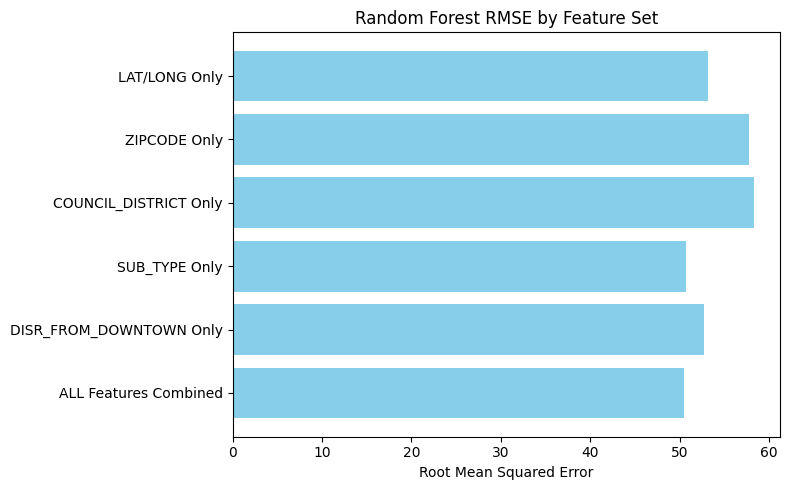

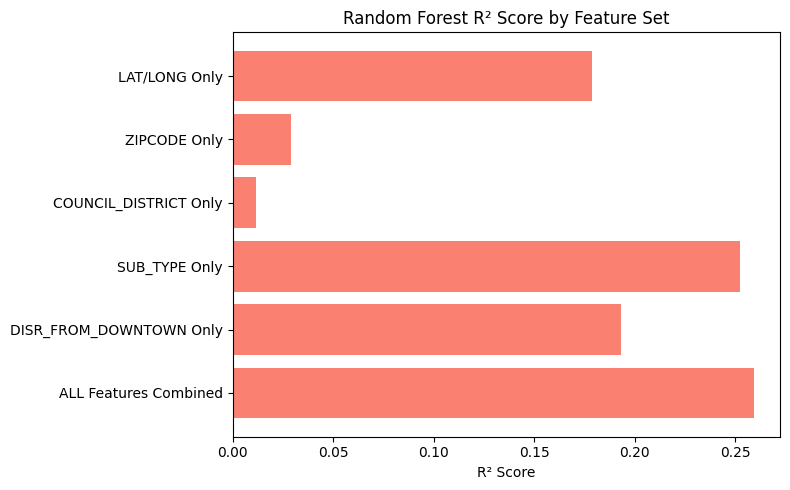

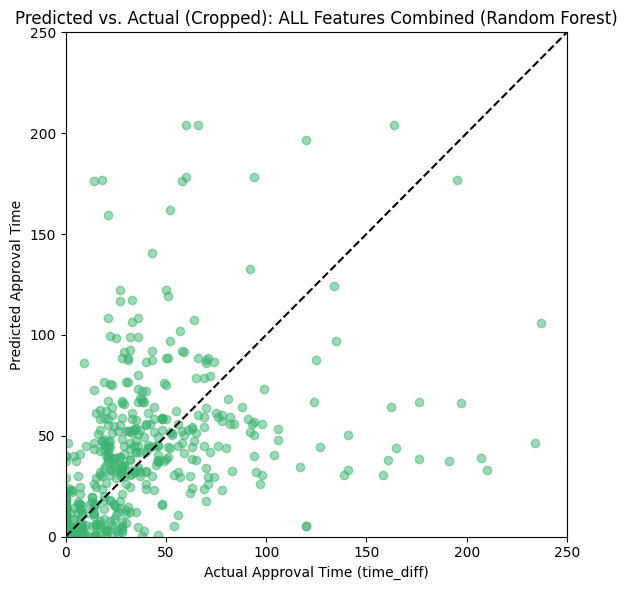

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

results = []
pred_vs_actual_data = {}

def run_random_forest(X, y, description):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)
    results.append({'Model': description, 'RMSE': rmse, 'R2': r2})
    pred_vs_actual_data[description] = (y_test, y_pred)

# Prepare features
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(df[['LATITUDE', 'LONGITUDE']])
coords_scaled_df = pd.DataFrame(coords_scaled, columns=['LATITUDE', 'LONGITUDE'])

subtype_encoded = pd.get_dummies(df[['SUB_TYPE']], drop_first=True)
zipcode_encoded = pd.get_dummies(df[['ZIPCODE']], drop_first=True)
council_encoded = pd.get_dummies(df[['COUNCIL_DISTRICT']], drop_first=True)
downtown_encoded = pd.DataFrame(df['DIST_FROM_DOWNTOWN'])


# Run regressions
run_random_forest(coords_scaled_df, df['time_diff'], "LAT/LONG Only")
run_random_forest(zipcode_encoded, df['time_diff'], "ZIPCODE Only")
run_random_forest(council_encoded, df['time_diff'], "COUNCIL_DISTRICT Only")
run_random_forest(subtype_encoded, df['time_diff'], "SUB_TYPE Only")
run_random_forest(downtown_encoded, df['time_diff'], "DISR_FROM_DOWNTOWN Only")


# features_subtype_latlong = pd.concat([coords_scaled_df, subtype_encoded], axis=1)
# run_random_forest(features_subtype_latlong, df['time_diff'], "SUB_TYPE + LAT/LONG")

# features_geo_subtype = pd.concat([subtype_encoded, zipcode_encoded, council_encoded], axis=1)
# run_random_forest(features_geo_subtype, df['time_diff'], "SUB_TYPE + ZIP + DISTRICT")

df_all = df[['LATITUDE', 'LONGITUDE', 'SUB_TYPE', 'ZIPCODE', 'COUNCIL_DISTRICT', 'DIST_FROM_DOWNTOWN']].copy()
df_all[['LATITUDE', 'LONGITUDE']] = scaler.fit_transform(df_all[['LATITUDE', 'LONGITUDE']])
df_all_encoded = pd.get_dummies(df_all, columns=['SUB_TYPE', 'ZIPCODE', 'COUNCIL_DISTRICT', 'DIST_FROM_DOWNTOWN'], drop_first=True)
run_random_forest(df_all_encoded, df['time_diff'], "ALL Features Combined")

# Convert to DataFrame
results_df = pd.DataFrame(results)

# --- Plot RMSE ---
plt.figure(figsize=(8, 5))
plt.barh(results_df['Model'], results_df['RMSE'], color='skyblue')
plt.xlabel('Root Mean Squared Error')
plt.title('Random Forest RMSE by Feature Set')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# --- Plot R² ---
plt.figure(figsize=(8, 5))
plt.barh(results_df['Model'], results_df['R2'], color='salmon')
plt.xlabel('R² Score')
plt.title('Random Forest R² Score by Feature Set')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# --- Scatter Plot for Best Model ---
# --- Scatter Plot for Best Model (Cropped) ---
best_model_name = results_df.sort_values(by='R2', ascending=False).iloc[0]['Model']
y_test_best, y_pred_best = pred_vs_actual_data[best_model_name]

plt.figure(figsize=(6, 6))
plt.scatter(y_test_best, y_pred_best, alpha=0.5, color='mediumseagreen')
plt.plot([0, 250], [0, 250], color='black', linestyle='--')  # Diagonal line from 0 to 250
plt.xlabel('Actual Approval Time (time_diff)')
plt.ylabel('Predicted Approval Time')
plt.title(f'Predicted vs. Actual (Cropped): {best_model_name} (Random Forest)')
plt.xlim(0, 250)
plt.ylim(0, 250)
plt.tight_layout()
plt.show()



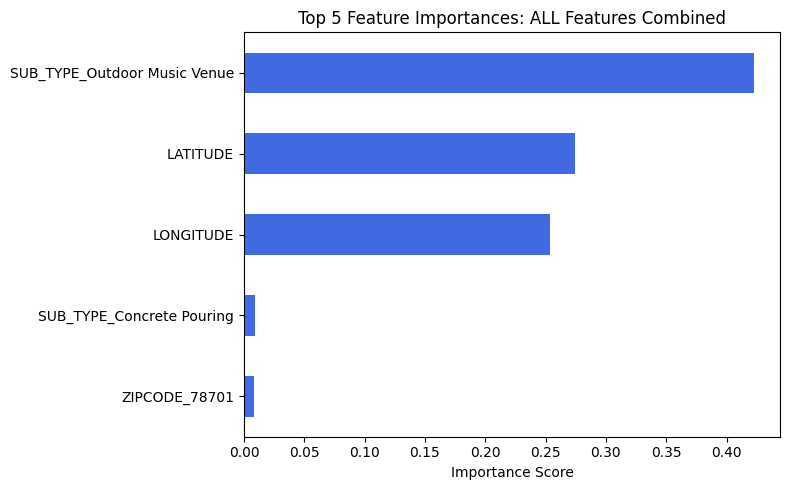

In [31]:
best_features_df = {
    "LAT/LONG Only": coords_scaled_df,
    "ZIPCODE Only": zipcode_encoded,
    "COUNCIL_DISTRICT Only": council_encoded,
    "SUB_TYPE Only": subtype_encoded,
    "SUB_TYPE + LAT/LONG": features_subtype_latlong,
    "SUB_TYPE + ZIP + DISTRICT": features_geo_subtype,
    "ALL Features Combined": df_all_encoded
}

X_best = best_features_df[best_model_name]
y = df['time_diff']

# Train again for feature importances
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_best, y)

# Get and sort feature importances
importances = pd.Series(model.feature_importances_, index=X_best.columns).sort_values(ascending=False).head(5)

# Plot top 5 feature importances
plt.figure(figsize=(8, 5))
importances.plot(kind='barh', color='royalblue')
plt.xlabel("Importance Score")
plt.title(f"Top 5 Feature Importances: {best_model_name}")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()